## Circle Data Science Challenge

This repository contains a sample of synthetic data for the Circle Data Scientist Recruiting process. 
We have the transactions below with fraud labeling. 
We need your help to analyze the data and build fraud detection model.
We expect you to do the following dasks:
* Analyze the data as your data science daily job and help us to find critical insights for fraud detection.
* Build and evaluate some machine learning models, and explain how and why you do this.
* Share some thoughts about how you plan do the realtime inference for production env in the cloud. What is your consideration for trade-off. 
* EXTRA: Any interesting thing you learn from the data

Please send your answer without the transaction data to your recruiter, and include your name in the title of notebook. Respect you have your daily job, we can give you a week of time to send back the code resuilt. 
Thank you for your interest, and look forward to hearing from you soon.

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from IPython.display import display
import datetime # manipulating date formats
from datetime import datetime as dt
import statsmodels.api as sm
# Loading visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling as pp
import time
import sys
import gc
import pickle

from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

# Formating the code
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv ('transactionV2.csv')
df.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,128037,2019-03-11 17:22:21,2296006538441789,fraud_Stamm-Witting,shopping_net,4.08,Judy,Hogan,F,4970 Michelle Burgs,...,40.6816,-73.9798,2504700,Medical sales representative,1999-09-01,250f7bdb3d040d18de14a51b17300cb8,1331486541,40.577566,-73.222286,False
1,491755,2019-08-03 03:45:26,30360260465747,fraud_Bradtke PLC,grocery_pos,124.90,Jennifer,Garcia,F,28777 Stewart Plains Apt. 495,...,41.1949,-89.4409,754,"Presenter, broadcasting",1962-05-13,44ec0dc9f8bd8b64c4b527e5b80431c7,1343965526,42.089683,-89.516604,False
2,470924,2019-07-26 19:30:01,503848303379,fraud_Schoen-Quigley,kids_pets,173.39,Gregory,Wallace,M,27203 Darrell Landing,...,26.5290,-82.0916,3776,Sport and exercise psychologist,1976-09-12,74dd18242d9888aa07da26f50c4759d7,1343331001,25.685711,-81.378745,False
3,491263,2019-08-02 23:40:30,4169759661243568,"fraud_McDermott, Osinski and Morar",home,38.55,Jamie,Carr,F,55363 Aaron Circle Suite 450,...,40.2236,-76.5380,213,Special educational needs teacher,1972-02-15,85ef13213b756317285e7859540eecb4,1343950830,40.188092,-76.450154,False
4,836489,2019-12-12 16:51:32,4810789809665942990,fraud_Kozey-Boehm,shopping_net,7.11,Julie,Sanchez,F,916 Charles Road,...,39.5756,-83.7153,338,Quantity surveyor,1988-07-28,b531c4476ccb4d3e0788bb5c4ca28593,1355331092,40.155245,-83.894408,False


# Data Exploration

In [3]:
# how many instances are fraud?
df[df.is_fraud == True].shape

(1783, 23)

In [4]:
df.columns

Index(['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category',
       'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip',
       'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud'],
      dtype='object')

In [5]:
# Data Profiling
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/36 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# fraud instances data profiling
pp.ProfileReport(df[df.is_fraud == True])

Summarize dataset:   0%|          | 0/37 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Data Pre-Processing

In [7]:
df.columns

Index(['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category',
       'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip',
       'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud'],
      dtype='object')

# Feature Engineering

create age feature from dob

(array([ 6264., 11866., 17191., 16016., 14092.,  8877.,  7315.,  4114.,
         2807.,  2225.]),
 array([16. , 24.1, 32.2, 40.3, 48.4, 56.5, 64.6, 72.7, 80.8, 88.9, 97. ]),
 <BarContainer object of 10 artists>)

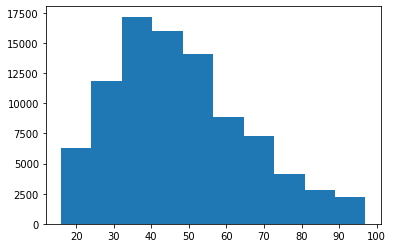

In [8]:
df['dob'] = pd.to_datetime(df.dob, format = '%Y-%m-%d')
df['age'] = dt.today().year - df.dob.dt.year

counts, bins = np.histogram(df.age)
plt.hist(bins[:-1], bins, weights=counts)

create date features

In [9]:
df.columns

Index(['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category',
       'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip',
       'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud', 'age'],
      dtype='object')

In [289]:
df.merchant[1:10]

1                     fraud_Bradtke PLC
2                  fraud_Schoen-Quigley
3    fraud_McDermott, Osinski and Morar
4                     fraud_Kozey-Boehm
5                      fraud_Metz-Boehm
6                  fraud_Padberg-Rogahn
7      fraud_Ledner, Hartmann and Feest
8    fraud_O'Connell, Botsford and Hand
9               fraud_Hackett-Lueilwitz
Name: merchant, dtype: object

In [10]:
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'], format = '%Y-%m-%d %H:%M:%S', errors = 'coerce')

df['trans_year'] = df['trans_date_trans_time'].dt.year
df['trans_month'] = df['trans_date_trans_time'].dt.month
df['trans_week'] = df['trans_date_trans_time'].dt.week
df['trans_day'] = df['trans_date_trans_time'].dt.day
df['trans_hour'] = df['trans_date_trans_time'].dt.hour
df['trans_minute'] = df['trans_date_trans_time'].dt.minute
df['trans_dayofweek'] = df['trans_date_trans_time'].dt.dayofweek

select features to be used

In [88]:
features = ['category', 'gender', 'state', 'amt', 'zip', 'city_pop', 'unix_time', 
            'trans_year', 'trans_month', 'trans_week', 'trans_day', 'trans_hour', 'trans_minute', 'trans_dayofweek', 'age']

In [89]:
# "Cardinality" means the number of unique values in a column
# Select categorical columns with relatively low cardinality (convenient but arbitrary)
categorical_cols = [cname for cname in df[features].columns if
                    df[cname].nunique() < 52 and
                    df[cname].dtype == "object"]
categorical_cols

['category', 'gender', 'state']

In [286]:
from sklearn.compose import make_column_selector

# Select numerical columns
numerical_cols = [cname for cname in df[features].columns if
                df[cname].dtype in ['int64', 'float64']]
numerical_cols

['amt',
 'zip',
 'city_pop',
 'unix_time',
 'trans_year',
 'trans_month',
 'trans_week',
 'trans_day',
 'trans_hour',
 'trans_minute',
 'trans_dayofweek',
 'age']

In [14]:
cols = numerical_cols + categorical_cols
[cname for cname in df.columns if cname not in cols]

['Unnamed: 0',
 'trans_date_trans_time',
 'cc_num',
 'merchant',
 'first',
 'last',
 'street',
 'city',
 'lat',
 'long',
 'job',
 'dob',
 'trans_num',
 'merch_lat',
 'merch_long',
 'is_fraud']

Split data

In [183]:
x = df[features].copy()
y = df.is_fraud

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=21)
print('Train set:', x_train.shape,  y_train.shape)
print('Test set:', x_test.shape,  y_test.shape)

Train set: (72613, 15) (72613,)
Test set: (18154, 15) (18154,)


In [17]:
x_train.head()

,category,gender,state,amt,zip,city_pop,unix_time,trans_year,trans_month,trans_week,trans_day,trans_hour,trans_minute,trans_dayofweek,age
80179,home,F,MI,69.39,48438,6951,1350758632,2019,10,42,20,18,43,6,36
37766,shopping_net,F,IN,62.07,46254,910148,1342461779,2019,7,29,16,18,2,1,46
42696,travel,M,CA,7.26,92210,4677,1332027038,2019,3,11,17,23,30,6,66
79815,home,M,OH,25.44,43076,9051,1350317492,2019,10,42,15,16,11,1,38
31757,misc_net,F,NM,7.41,87543,247,1346125449,2019,8,35,28,3,44,2,60


In [118]:
x_train.columns

Index(['category', 'gender', 'state', 'amt', 'zip', 'city_pop', 'unix_time',
       'trans_year', 'trans_month', 'trans_week', 'trans_day', 'trans_hour',
       'trans_minute', 'trans_dayofweek', 'age'],
      dtype='object')

## Data Preprocessing

In [283]:
from sklearn.preprocessing import StandardScaler
from sklearn.compose import make_column_selector

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant'))
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols),
        ('scale', StandardScaler(), ['amt'])
    ], verbose_feature_names_out=False)

### Inspect Processed Data

In [288]:
preprocessor.fit(x_train)
processed = pd.DataFrame(preprocessor.transform(x_train).toarray(), columns = all_features)

# pp.ProfileReport(processed)

ValueError: Shape of passed values is (72613, 80), indices imply (72613, 79)

In [279]:
processed.head(10)

,amt,zip,city_pop,unix_time,trans_year,trans_month,trans_week,trans_day,trans_hour,trans_minute,...,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY
0,69.39,48438.0,6951.0,1.350759e+09,2019.0,10.0,42.0,20.0,18.0,43.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,62.07,46254.0,910148.0,1.342462e+09,2019.0,7.0,29.0,16.0,18.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,7.26,92210.0,4677.0,1.332027e+09,2019.0,3.0,11.0,17.0,23.0,30.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,25.44,43076.0,9051.0,1.350317e+09,2019.0,10.0,42.0,15.0,16.0,11.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,7.41,87543.0,247.0,1.346125e+09,2019.0,8.0,35.0,28.0,3.0,44.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,64.69,29860.0,46944.0,1.326421e+09,2019.0,1.0,2.0,13.0,2.0,18.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,44.04,36541.0,15647.0,1.358667e+09,2020.0,1.0,4.0,20.0,7.0,25.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,4.22,99746.0,277.0,1.328834e+09,2019.0,2.0,6.0,10.0,0.0,37.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,92.01,78040.0,248858.0,1.342141e+09,2019.0,7.0,28.0,13.0,0.0,55.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,103.17,92585.0,54287.0,1.341918e+09,2019.0,7.0,28.0,10.0,11.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Feature Selection

CPU times: user 36.3 s, sys: 291 ms, total: 36.6 s
Wall time: 9.42 s


model score on training data: 6.419169582927431e-05
model score on testing data: -2.0085073717091007e-05


Feature: 0, Score: 0.0000000021
Feature: 1, Score: 0.0000000001


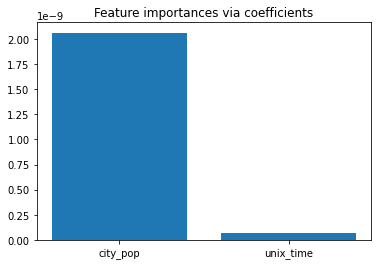

In [227]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LassoCV

%time pipeline = make_pipeline(preprocessor, LassoCV()).fit(x_train, y_train)

print('\n')
print('model score on training data: {}'.format(pipeline.score(x_train, y_train)))
print('model score on testing data: {}'.format(pipeline.score(x_test, y_test)))
print('\n')

importance = np.abs(pipeline.named_steps['lassocv'].coef_)
feature_names = np.array(all_features)
df_importance = pd.DataFrame(zip(feature_names, importance), columns = ['feature_names', 'importance'])

# summarize feature importance
importance_filt = importance[abs(importance) > 0]
for i,v in enumerate(importance_filt):
	print('Feature: %0d, Score: %.10f' % (i,v))
    
df_importance = df_importance.loc[abs(df_importance['importance']) > 0 ]

plt.bar(height=df_importance.importance, x=df_importance.feature_names)
plt.title("Feature importances via coefficients")
plt.show()

### Get all Feature Names

In [287]:
cat_features = clf.named_steps['preprocessor'].transformers_[1][1]\
   .named_steps['onehot'].get_feature_names(categorical_cols)

num_features = np.array(numerical_cols, dtype='object')

all_features = np.append(num_features, cat_features)
all_features

array(['amt', 'zip', 'city_pop', 'unix_time', 'trans_year', 'trans_month',
       'trans_week', 'trans_day', 'trans_hour', 'trans_minute',
       'trans_dayofweek', 'age', 'category_entertainment',
       'category_food_dining', 'category_gas_transport',
       'category_grocery_net', 'category_grocery_pos',
       'category_health_fitness', 'category_home', 'category_kids_pets',
       'category_misc_net', 'category_misc_pos', 'category_personal_care',
       'category_shopping_net', 'category_shopping_pos',
       'category_travel', 'gender_F', 'gender_M', 'state_AK', 'state_AL',
       'state_AR', 'state_AZ', 'state_CA', 'state_CO', 'state_CT',
       'state_DC', 'state_DE', 'state_FL', 'state_GA', 'state_HI',
       'state_IA', 'state_ID', 'state_IL', 'state_IN', 'state_KS',
       'state_KY', 'state_LA', 'state_MA', 'state_MD', 'state_ME',
       'state_MI', 'state_MN', 'state_MO', 'state_MS', 'state_MT',
       'state_NC', 'state_ND', 'state_NE', 'state_NH', 'state_NJ',
       's

In [230]:
from sklearn.linear_model import RidgeCV

model = RidgeCV()

# clf = make_pipeline(preprocessor, model)

clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('ridgecv',  model)])

clf.fit(x_train, y_train)

print(f'model score on training data: {clf.score(x_train, y_train)}')
print(f'model score on testing data: {clf.score(x_test, y_test)}')

model score on training data: -2356484517595063.0
model score on testing data: -2453925129081307.5


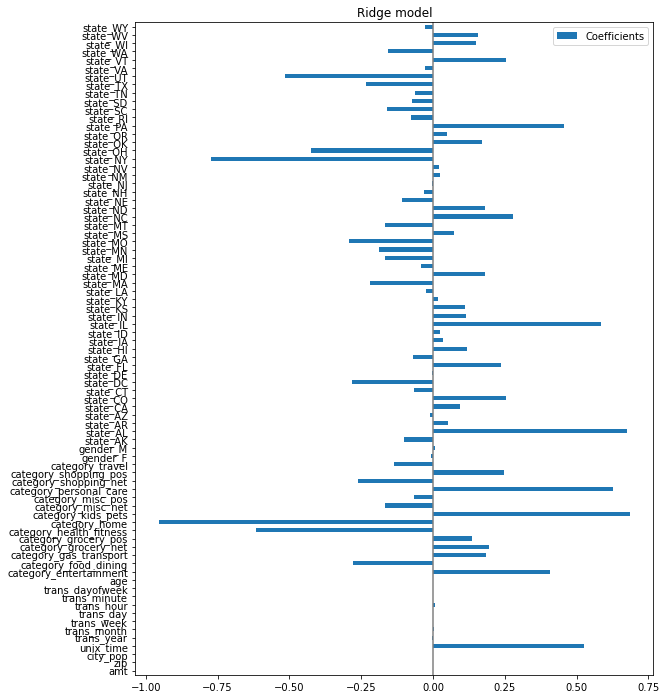

In [231]:
import matplotlib.pyplot as plt

coefficients = clf.named_steps['ridgecv'].coef_

coefs = pd.DataFrame(
   coefficients,
   columns=['Coefficients'], index=all_features
) 
coefs = coefs.loc[abs(coefs['Coefficients']) > 0 ]

importance = np.abs(coefficients)
feature_names = np.array(all_features)
df_importance = pd.DataFrame(zip(feature_names, importance), columns = ['feature_names', 'importance'])

# summarize feature importance
importance_filt = importance[abs(importance) > 0]
for i,v in enumerate(importance_filt):
	print('Feature: %0d, Score: %.10f' % (i,v))
    
df_importance = df_importance.loc[abs(df_importance['importance']) > 0 ]

coefs.plot(kind='barh', figsize=(12, 12))
plt.title('Ridge model')
plt.axvline(x=0, color='.5')
plt.subplots_adjust(left=.3)

In [236]:
df_importance = pd.DataFrame(zip(all_features, coefficients), columns = {'feature',  'importance'}).sort_values(by='importance')

df_importance = df_importance.loc[abs(df_importance['importance']) > 0]

display(df_importance.head(10))
display(x.tail(10))

,feature,importance
18,category_home,-0.955371
62,state_NY,-0.773960
17,category_health_fitness,-0.615610
72,state_UT,-0.513719
63,state_OH,-0.423915
52,state_MO,-0.292542
35,state_DC,-0.283171
13,category_food_dining,-0.278010
23,category_shopping_net,-0.262444
71,state_TX,-0.233619


,feature,coefficient
29,state_AL,-0.000000e+00
28,state_AK,-0.000000e+00
27,gender_M,-0.000000e+00
26,gender_F,0.000000e+00
25,category_travel,0.000000e+00
24,category_shopping_pos,-0.000000e+00
23,category_shopping_net,0.000000e+00
30,state_AR,0.000000e+00
78,state_WY,0.000000e+00
2,city_pop,2.232796e-09


In [ ]:
lasso.score(x_test, y_test)

In [157]:
# https://towardsdatascience.com/feature-selection-in-machine-learning-using-lasso-regression-7809c7c2771a
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Lasso

clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('lasso',  Lasso())])

search = GridSearchCV(clf,
                      {'lasso__alpha':np.arange(0.01,2,0.25)},
                      cv = 5, scoring="neg_mean_squared_error",verbose=3
                      )

search.fit(x_train,y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV 1/5] END ................lasso__alpha=0.01;, score=-0.019 total time=   0.3s
[CV 2/5] END ................lasso__alpha=0.01;, score=-0.020 total time=   0.2s
[CV 3/5] END ................lasso__alpha=0.01;, score=-0.018 total time=   0.3s
[CV 4/5] END ................lasso__alpha=0.01;, score=-0.020 total time=   0.3s
[CV 5/5] END ................lasso__alpha=0.01;, score=-0.020 total time=   0.2s
[CV 1/5] END ................lasso__alpha=0.26;, score=-0.019 total time=   0.2s
[CV 2/5] END ................lasso__alpha=0.26;, score=-0.020 total time=   0.3s
[CV 3/5] END ................lasso__alpha=0.26;, score=-0.018 total time=   0.2s
[CV 4/5] END ................lasso__alpha=0.26;, score=-0.020 total time=   0.2s
[CV 5/5] END ................lasso__alpha=0.26;, score=-0.020 total time=   0.2s
[CV 1/5] END ................lasso__alpha=0.51;, score=-0.019 total time=   0.2s
[CV 2/5] END ................lasso__alpha=0.51;, 

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='constant'))]),
                                                                         ['amt',
                                                                          'zip',
                                                                          'city_pop',
                                                                          'unix_time',
                                                                          'trans_year',
                                                                          'trans_month',
                                                                          'trans_week',
               

In [150]:
search.best_params_

{'lasso__alpha': 1.76}

,feature,importance
zip,zip,-6.445075e-09
unix_time,unix_time,-6.977704e-11
city_pop,city_pop,2.232796e-09


,feature,importance
zip,zip,-6.445075e-09
unix_time,unix_time,-6.977704e-11
city_pop,city_pop,2.232796e-09


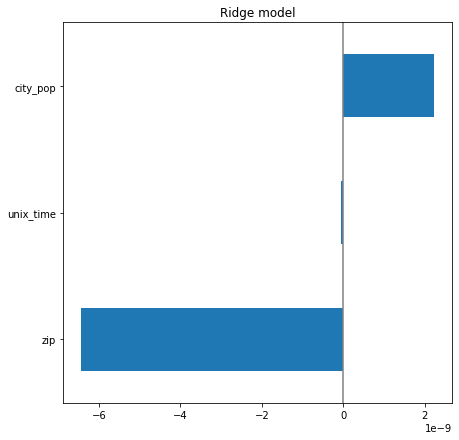

In [245]:
num_features = np.array(numerical_cols, dtype='object')
num_features

all_features = np.append(num_features, cat_features)
all_features

coefficients = search.best_estimator_.named_steps['lasso'].coef_
coefficients

import matplotlib.pyplot as plt

df_importance = pd.DataFrame(zip(all_features, coefficients), columns = {'feature',  'importance'}, index=all_features).sort_values(by='importance')
df_importance = df_importance.loc[abs(df_importance['importance']) > 0]

display(df_importance .head(10))
display(df_importance .tail(10))

df_importance.importance.plot(kind='barh', figsize=(9, 7))
plt.title('Ridge model')
plt.axvline(x=0, color='.5')
plt.subplots_adjust(left=.3)

In [249]:
# Define model
rfr = RandomForestRegressor(n_estimators=100, random_state=0)

# Create pipeline
pipeline = make_pipeline(preprocessor, rfr)

In [250]:
# Fit pipeline
%time pipeline.fit(x_train, y_train)

CPU times: user 4min 39s, sys: 1.91 s, total: 4min 41s
Wall time: 4min 47s


Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['amt', 'zip', 'city_pop',
                                                   'unix_time', 'trans_year',
                                                   'trans_month', 'trans_week',
                                                   'trans_day', 'trans_hour',
                                                   'trans_minute',
                                                   'trans_dayofweek', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                  

In [253]:
# Evaluate pipeline
print('Train set mse:', mean_squared_error(y_train, pipeline.predict(x_train)))
print('Test set mse:', mean_squared_error(y_test, pipeline.predict(x_test)))
print('Test set score:', pipeline.score(x_train, y_train))

Train set mse: 0.0027571839753212234
Test set mse: 0.018881139142888616
Test set score: 0.8581541149323948


# Model Persistence
Serialize model object using pickle

In [ ]:
# Save pipeline fit object
from joblib import dump, load
dump(pipeline, './pipeline.joblib')

In [ ]:
# Saving the model data:
with open('./model_data.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump([x_train, x_train_test, y_train, y_train_test], f)

# Model Development & Evaluation

In [ ]:
# Linear regression
lr = LinearRegression()
pipeline = make_pipeline(preprocessor, lr)
# Fit pipeline
%time pipeline.fit(x_train, y_train)
print('Train set mse:', mean_squared_error(y_train, pipeline.predict(x_train)))
print('Test set mse:', mean_squared_error(y_train_test, pipeline.predict(x_train_test)))
print('Test set score:', pipeline.score(x_train, y_train))

In [ ]:
# Random forest regression
rfr = RandomForestRegressor(n_estimators = 100)
pipeline = make_pipeline(preprocessor, rfr)
# Fit pipeline
%time pipeline.fit(x_train, y_train)
print('Train set mse:', mean_squared_error(y_train, pipeline.predict(x_train)))
print('Test set mse:', mean_squared_error(y_train_test, pipeline.predict(x_train_test)))
print('Test set score:', pipeline.score(x_train, y_train))

## Export Environment

In [ ]:
!conda env export > environment.yml